# CAM Compression Evaluation Notebook

This notebook allows users to compare CAM data in
its original form to CAM data that has undergone three different levels of lossy compression labels as follows: "conservative", "middle ground", and "aggressive". The
tools provided in ldcpy are intended to highlight differences due to compression
artifacts in order to assist scientist in evaluating the amount of lossy
compression to apply to their data.

The data used here are NetCDF files in "timeseries" file format, meaning
that each NetCDF file contains one (major) output variable (e.g., surface
temperature or precipitation rate) and spans multiple timesteps (daily, monthly).

This notebook is meant to be run on NCAR's JupyterHub (https://jupyterhub.hpc.ucar.edu). We will use a subset of CAM data on glade located in /glade/campaign/cisl/asap/abaker/CAM_lossy_test_data_31.

It will help to first be familiar with the LargeDataGladeNotebook example.

**You can run your notebook with the "NPL 2023a" kernel (choose from the
dropdown in the upper left.)**


In [1]:
# Add ldcpy root to system path (MODIFY FOR YOUR LDCPY CODE LOCATION)
import sys

sys.path.insert(0, '/glade/u/home/abaker/repos/ldcpy')

# Import ldcpy package
# Autoreloads package everytime the package is called, so changes to code will be reflected in the notebook if the above sys.path.insert(...) line is uncommented.
%load_ext autoreload
%autoreload 2

# suppress all of the divide by zero warnings
import warnings

warnings.filterwarnings("ignore")

import ldcpy

# display the plots in this notebook
%matplotlib inline

### Connect to DASK distributed cluster :

Since we use the PBS Pro scheduler at NCAR, we will use the PBSCluster  scheduler from dask-jobqueue. Initialization is similar to a LocalCluster, but with unique parameters specific to creating batch jobs.
Helpful info about using DASK at NCAR: https://github.com/NCAR/Xarray-Dask-ESDS-2024/blob/main/notebooks/02-dask-intro.ipynb

Also useful: https://jobqueue.dask.org/en/latest/howitworks.html


In [2]:
import dask
from dask_jobqueue import PBSCluster

You'll need to customize the parameters of the PBSCluster template for the resources that will be assigned to each batch job.


In [3]:
cluster = PBSCluster(
    # Basic job directives
    job_name='ldcpy-camnb',
    queue='casper',
    walltime='60:00',
    # Make sure you change the project code if running this notebook!!
    account='NTDD0004',
    log_directory='dask-logs',
    # These settings impact the resources assigned to the job
    cores=1,
    memory='10GiB',
    resource_spec='select=1:ncpus=1:mem=10GB',
    # These settings define the resources assigned to a worker
    processes=1,
    # This controls where Dask will write data to disk if memory is exhausted
    local_directory='/local_scratch/pbs.$PBS_JOBID/dask/spill',
    # This specifies which network interface the cluster will use
    interface='ext',
)

We've created a cluster using PBSCluster(), and now we need Dask to provide an object called the Client for interacting with the cluster and workers.

In [4]:
from dask.distributed import Client

# Attach a "client" to our created cluster
client = Client(cluster)

# Display the client repr
client

Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/abaker/proxy/8787/status,
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/abaker/proxy/8787/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://128.117.208.103:37979,Workers: 0
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/abaker/proxy/8787/status,Total threads: 0
Started: Just now,Total memory: 0 B


In [5]:
# Scale the cluster adaptively
cluster.adapt(minimum_jobs=1, maximum_jobs=36)
# Scale the cluster to some number of workers
# cluster.scale(2)
# Block progress until workers have spawned (optional - typically only in demos and benchmarks!)
# cluster.wait_for_workers(2)

In [10]:
cluster.workers

{'PBSCluster-0': <dask_jobqueue.pbs.PBSJob: status=running>}

In [9]:
# See the workers in the job scheduler
!qstat -u $USER

                                                            Req'd  Req'd   Elap
Job ID          Username Queue    Jobname    SessID NDS TSK Memory Time  S Time
--------------- -------- -------- ---------- ------ --- --- ------ ----- - -----
9524572.casper* abaker   htc      STDIN       73721   1   1   10gb 02:00 R 01:36


## Overview


This notebook demonstrates the use of ldcpy on several CAM variables of interest. It assumes that users are familiar with basic functions of ldcpy, as shown in the Tutorial Notebook. The following CAM variables are used in this notebook:

Daily:
- TS (Average Daily Surface Temperature)
- PRECT (Average Total Precipitation)
- TAUX (Zonal surface stress)
- FLUT (Upward longwave flux at top of model)
- Z500 (500 mb geo-potential height)
- LHFLX (Surface latent heat flux)

Monthly:
- TS (Average Daily Surface Temperature)
- U* (Zonal wind component)
- FLNS (Net upward longwave flux at surface)
- CCN3* (CCN concentration at S=0.1%)
- CLOUD* (Cloud fraction)
- TMQ (Total precipitable water)
- PS (Surface pressure)
- FSNS (Net solar flux at surface)
- FSNT (Net solar flux at top of the model)
- FLNT (Net longwave flux at top of model)
- SHFLX (Surface sensible heat flux)
- LHFLX (Surface latent heat flux)
- QFLX (Surface water flux)
- PRECC (Convective precipitation rate )
- PRECL (Large-scale precipitation rate)


Where * indicates a 3D variable.

For information about installation, see
[these instructions](https://ldcpy.readthedocs.io/en/latest/installation.html),
and for information about usage, see the API reference
[here](https://ldcpy.readthedocs.io/en/latest/api.html#ldcpy.plot.plot),
and the [Tutorial Notebook](./TutorialNotebook.ipynb).

## Loading Datasets and Viewing Metadata


In [8]:
# daily variables
dataDir = "/glade/campaign/cisl/asap/abaker/CAM_lossy_test_data_31"
cols_daily = {}
# for daily_variable in ["TS", "PRECT"]:
for daily_variable in ["TS", "PRECT", "TAUX", "FLUT", "Z500", "LHFLX"]:
    cols_daily[daily_variable] = ldcpy.open_datasets(
        "cam-fv",
        [daily_variable],
        [
            f"{dataDir}/orig/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h1.{daily_variable}.20060101-20071231.nc",
            f"{dataDir}/conservative/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h1.{daily_variable}.20060101-20071231.nc",
            f"{dataDir}/middle_ground/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h1.{daily_variable}.20060101-20071231.nc",
            f"{dataDir}/aggressive/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h1.{daily_variable}.20060101-20071231.nc",
        ],
        ["orig", "conservative", "middle_ground", "aggressive"],
    )

dataset size in GB 0.65

dataset size in GB 0.65

dataset size in GB 0.65

dataset size in GB 0.65

dataset size in GB 0.65

dataset size in GB 0.65



In [9]:
# monthly vars
dataDir = "/glade/campaign/cisl/asap/abaker/CAM_lossy_test_data_31"
cols_monthly = {}
for monthly_variable in [
    "TS",
    "U",
    "FLNS",
    "CCN3",
    "CLOUD",
    "TMQ",
    "PS",
    "FSNS",
    "SHFLX",
    "LHFLX",
    "FLNT",
    "QFLX",
    "PRECC",
    "PRECL",
    "FSNT",
]:
    cols_monthly[monthly_variable] = ldcpy.open_datasets(
        "cam-fv",
        [monthly_variable],
        [
            f"{dataDir}/orig/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.{monthly_variable}.200601-201012.nc",
            f"{dataDir}/conservative/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.{monthly_variable}.200601-201012.nc",
            f"{dataDir}/middle_ground/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.{monthly_variable}.200601-201012.nc",
            f"{dataDir}/aggressive/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.{monthly_variable}.200601-201012.nc",
        ],
        ["orig", "conservative", "middle_ground", "aggressive"],
    )

dataset size in GB 0.05

dataset size in GB 1.59

dataset size in GB 0.05

dataset size in GB 1.59

dataset size in GB 1.59

dataset size in GB 0.05

dataset size in GB 0.05

dataset size in GB 0.05

dataset size in GB 0.05

dataset size in GB 0.05

dataset size in GB 0.05

dataset size in GB 0.05

dataset size in GB 0.05

dataset size in GB 0.05

dataset size in GB 0.05



## Getting Started

The next several sections are designed to help users get started analyzing the variables that may be of interest to them. For each of these sections, we use timestep 0 to compare summary statistics. For the spatial and time series plots, we average over the appropriate dimensions.

### Daily TS - Average Daily Surface Temperature

Here we take a look at timestep zero for the TS variable and compare it to the original data at various compression levels. Comparing across multiple datasets can take some time, and this may take a few minutes to run. In the future, we are considering running some of the more expensive calculations on GPUs.

#### Summary Statistics

In [10]:
ds = cols_daily["TS"].isel(time=0)
ldcpy.compare_stats(
    ds,
    "TS",
    ["orig", "conservative", "middle_ground", "aggressive"],
    significant_digits=6,
)

,orig,conservative,middle_ground,aggressive
mean,284.644,284.644,284.644,284.644
variance,510.349,510.349,510.348,510.343
standard deviation,22.5909,22.5909,22.5909,22.5908
min value,218.119,218.119,218.117,218.125
min (abs) nonzero value,218.119,218.119,218.117,218.125
max value,321.471,321.471,321.469,321.5
probability positive,1,1,1,1
number of zeros,0,0,0,0
spatial autocorr - latitude,0.994338,0.994338,0.994338,0.994328
spatial autocorr - longitude,0.997145,0.997145,0.997145,0.997136


TypeError: 'NoneType' object is not iterable

#### Plotting the Data

Viewing the North_South contrast variance data in spatial format is done below:

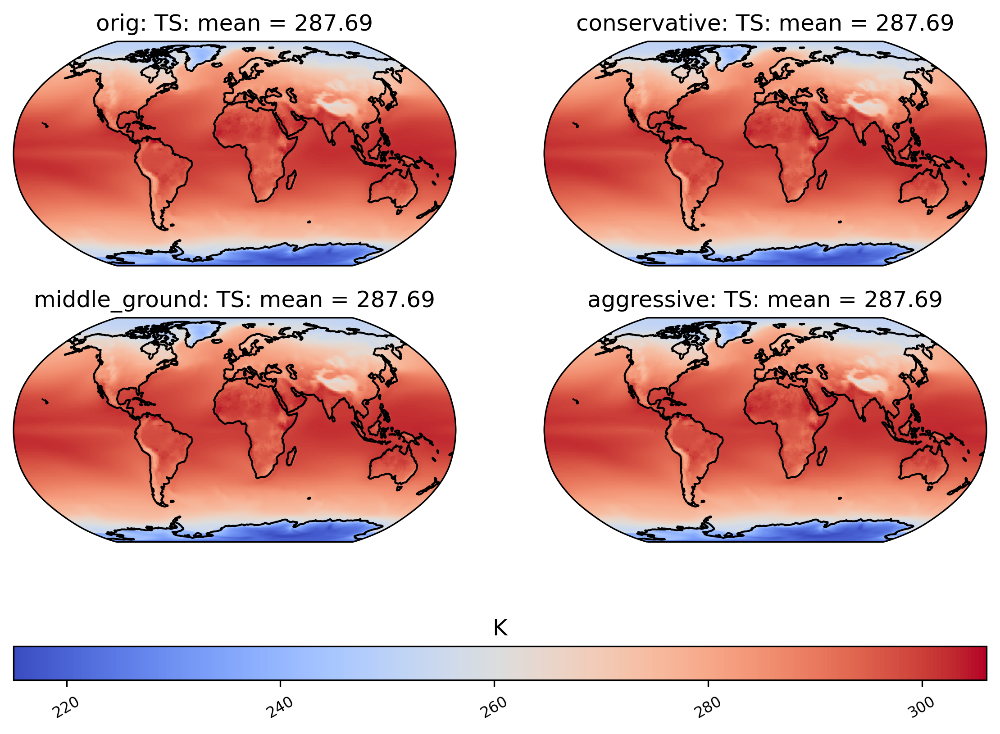

In [11]:
ldcpy.plot(
    cols_daily["TS"],
    "TS",
    sets=["orig", "conservative", "middle_ground", "aggressive"],
    calc="mean",
)

In many cases, the mean values look identical or nearly identical to the eye, so we can use difference plots to identify regions where large compression errors can be found. The magnitude in the errors decreases rapidly, often plotting a side-by-side comparison of the errors is misleading because it looks like only the most compressed image has any noticeable compression errors. In these cases, it is best to plot each error plot separately. Also, it is often a good idea to set the axes_symmetric parameter to true, to center the colorbar about zero. In the following plots the mean errors for two different compression levels are shown. Note the change in magnitude of the color scale for the separate error plots.

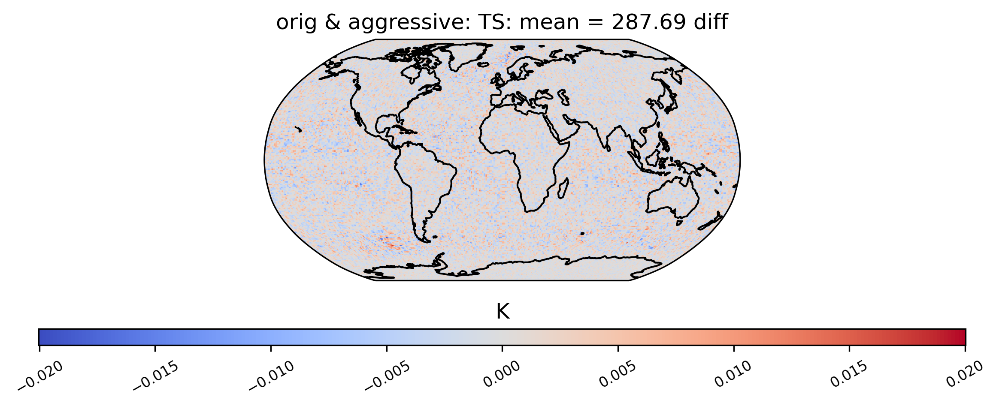

In [12]:
ldcpy.plot(
    cols_daily["TS"],
    "TS",
    sets=["orig", "aggressive"],
    calc="mean",
    calc_type="diff",
    axes_symmetric=True,
)

### Check for statistical significance of errors

Many error quantities have large changes in magnitude over the available range of compression levels. To avoid this issue, is may be best to plot each of these separately, or only compare two or three compression levels at a time using each plot() call. (Plotting all at once forces the same color bar for each.)

The below plots check two lightly compressed datasets for statistical significance in errors (under the null hypothesis of mean zero errors). Interestingly, among these datasets is is the least-compressed dataset that exhibits the most bias in the errors at each point.

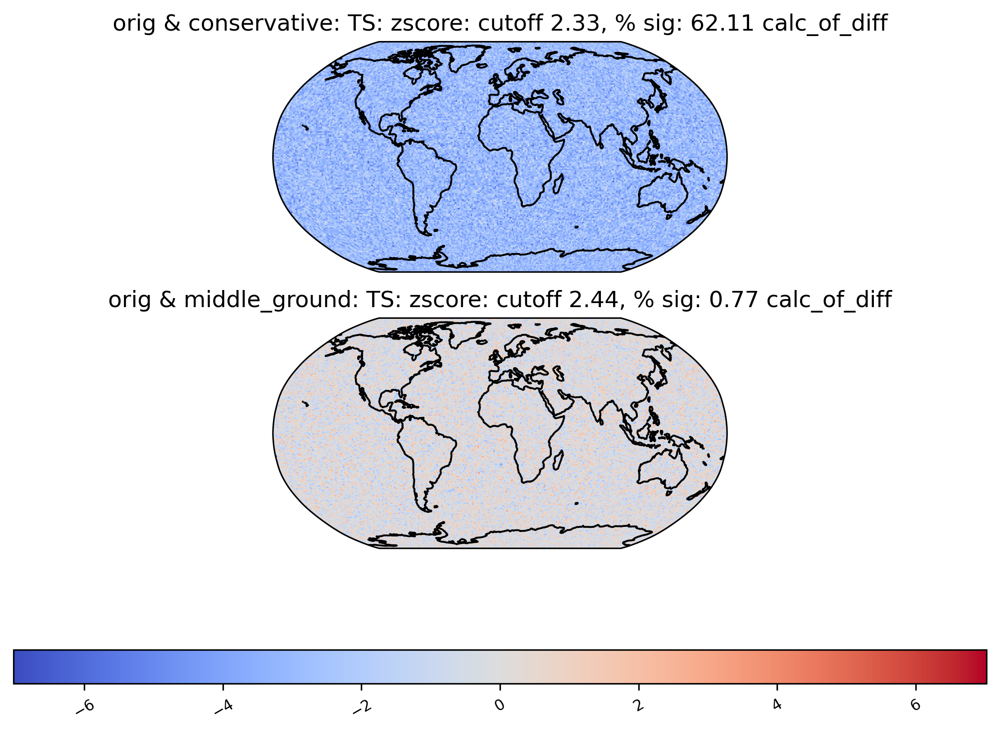

In [13]:
ldcpy.plot(
    cols_daily["TS"],
    "TS",
    sets=["orig", "conservative", "middle_ground"],
    calc="zscore",
    calc_type="calc_of_diff",
    axes_symmetric=True,
)

### Create a histogram of the errors at a particular point

We can create a histogram of the time-series of errors at a particular point (by specifying the lat and lon). Indeed, we find that the most lightly-compressed dataset has errors that are smaller in magnitude, but appear to be biased in one direction.

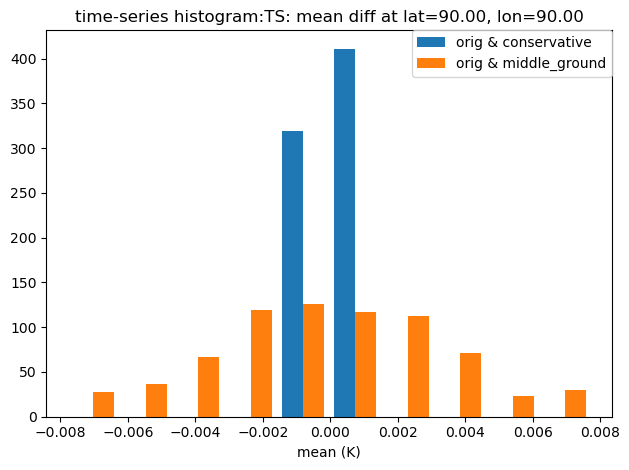

In [14]:
ldcpy.plot(
    cols_daily["TS"],
    "TS",
    sets=["orig", "conservative", "middle_ground"],
    calc="mean",
    calc_type="diff",
    plot_type="histogram",
    lat=90,
    lon=90,
)

### Create a histogram of the errors at a particular point

We can grab the data values if we want to use them for further analysis. The following code selects the data for a single compression level and location, then manually computes the histogram data:

In [15]:
# get the orig dataset
orig_data = cols_daily["TS"]["TS"].sel(collection="orig", lat=90, lon=90)

# get the middle_ground dataset
br_mg_data = cols_daily["TS"]["TS"].sel(collection="middle_ground", lat=90, lon=90)

# get the conservative dataset
br_c_data = cols_daily["TS"]["TS"].sel(collection="conservative", lat=90, lon=90)

In [16]:
hist_blue_data = orig_data - br_mg_data
hist_orange_data = orig_data - br_c_data

In [17]:
# To output data
# hist_blue_data.data.compute()

## Analyzing Other Variables

Performing the above analysis can be done for any of the available daily or monthly variables by changing the variable setting below, and rerunning the analysis. You may use any of the compression level names specified in the open_datasets function by changing the sets list in each plot call.

In [18]:
variable = "PRECT"
frequency = "daily"

In [19]:
if frequency == "daily":
    cols = cols_daily
elif frequency == "monthly":
    cols = cols_monthly

### Summary Statistics

As mentioned above, comparing the summary statistics may take several minutes if many datasets are specified. The below code selects the first timestep and level by default.

In [20]:
ds = cols[variable].isel(time=0)
ldcpy.compare_stats(
    ds,
    variable,
    ["orig", "conservative", "middle_ground", "aggressive"],
    significant_digits=6,
)

,orig,conservative,middle_ground,aggressive
mean,2.73814e-08,2.73815e-08,2.73821e-08,2.73616e-08
variance,5.9544e-15,5.95445e-15,5.95954e-15,5.9551e-15
standard deviation,7.71648e-08,7.71651e-08,7.7198e-08,7.71693e-08
min value,-1.16413e-20,-1.16401e-20,-1.16467e-20,-1.18585e-20
min (abs) nonzero value,8.59921e-32,8.59928e-32,8.62817e-32,8.62817e-32
max value,4.33175e-06,4.33251e-06,4.35114e-06,4.29153e-06
probability positive,0.9611,0.9611,0.9611,0.9611
number of zeros,2097,2097,2097,2097
spatial autocorr - latitude,0.797032,0.797033,0.796893,0.797367
spatial autocorr - longitude,0.801287,0.801287,0.801242,0.801379


TypeError: 'NoneType' object is not iterable

### Spatial Plots of Quantities and Errors

#### Spatial Plot of a Quantity

Change the quantity parameter to plot a different quantity. The available list of parameter values can be found [here](https://ldcpy.readthedocs.io/en/latest/api.html#ldcpy.plot.plot).

In [21]:
quantity = "std"

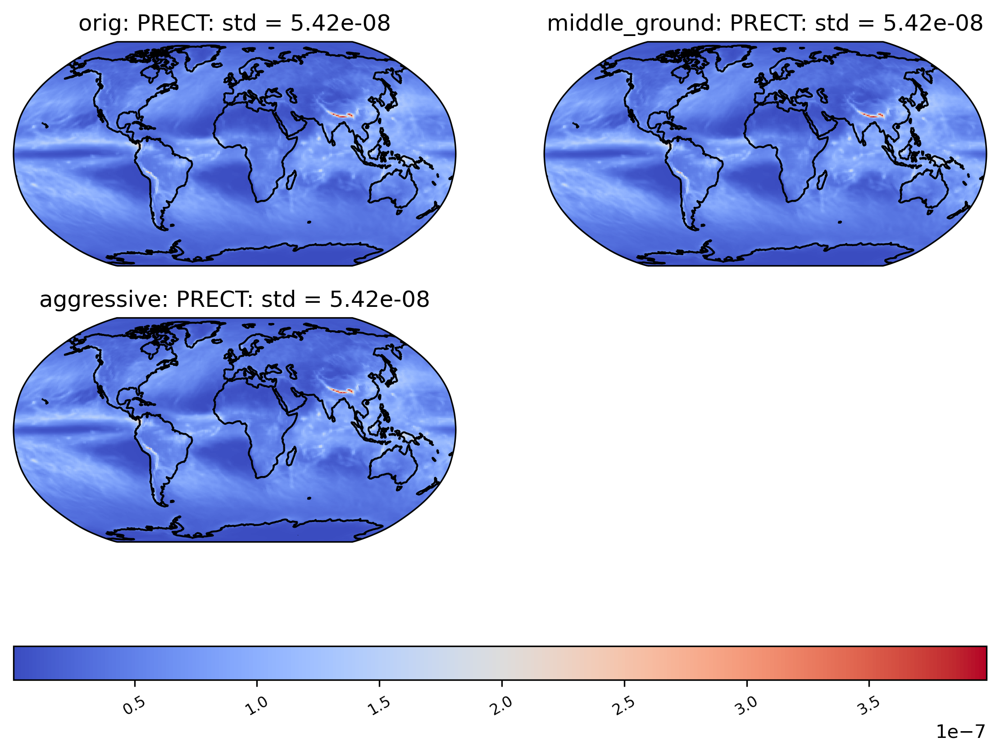

In [22]:
ldcpy.plot(
    cols[variable],
    variable,
    sets=[
        "orig",
        "middle_ground",
        "aggressive",
    ],
    calc=quantity,
)

#### Spatial Plot of Mean Quantity Errors for Multiple Levels

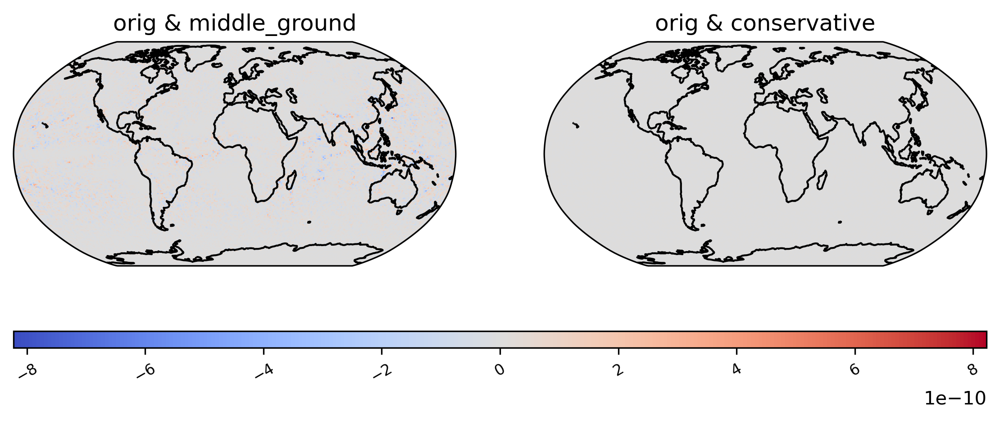

In [23]:
ldcpy.plot(
    cols[variable],
    variable,
    sets=["orig", "middle_ground", "conservative"],
    calc=quantity,
    calc_type="diff",
    axes_symmetric=True,
    short_title=True,
)

#### Spatial Plot of Mean Errors for a Single Level

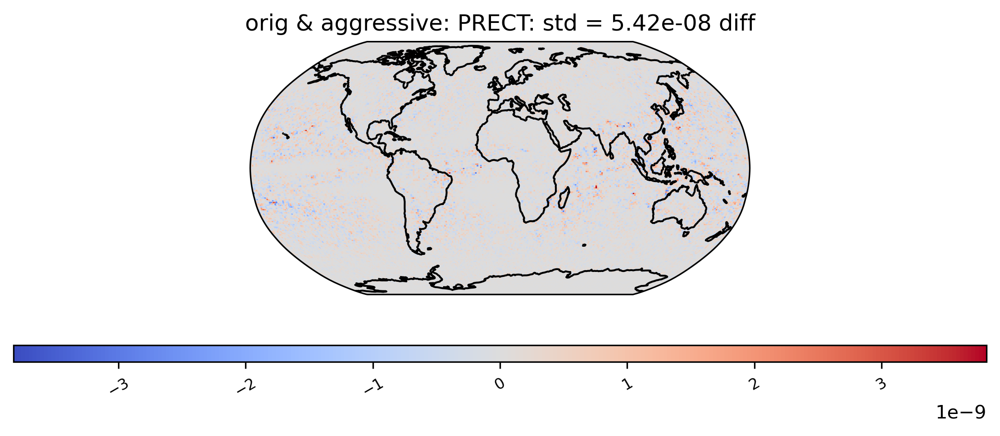

In [24]:
ldcpy.plot(
    cols[variable],
    variable,
    sets=["orig", "aggressive"],
    calc=quantity,
    calc_type="diff",
    axes_symmetric=True,
)

### Time-Series Plot of Quantity

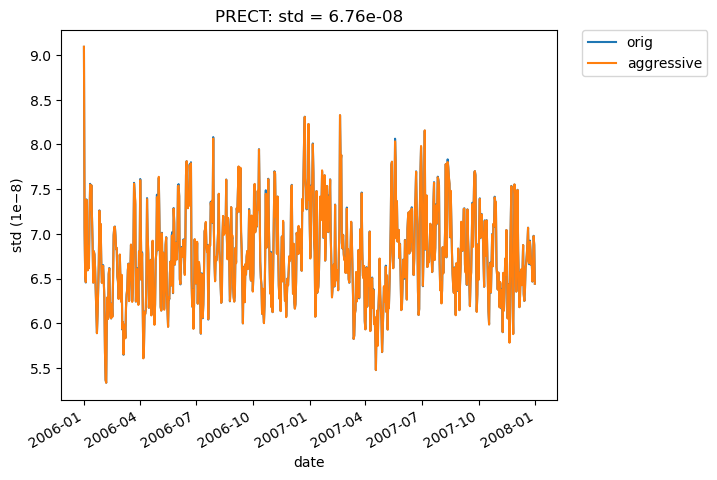

In [25]:
ldcpy.plot(
    cols[variable], variable, sets=["orig", "aggressive"], calc=quantity, plot_type="time_series"
)

### Histogram of Time-Series Plot of Quantity

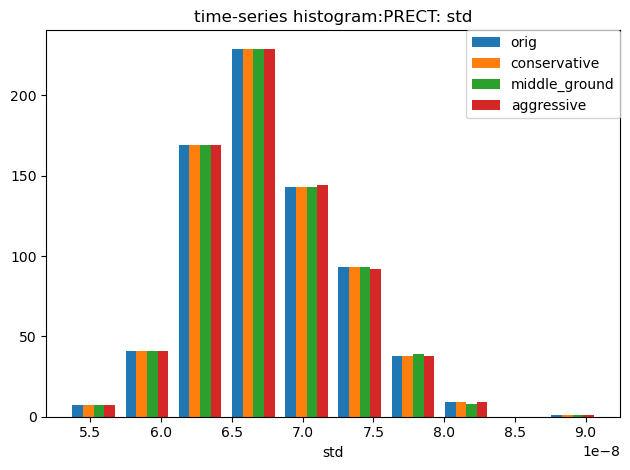

In [26]:
ldcpy.plot(
    cols[variable],
    variable,
    sets=["orig", "conservative", "middle_ground", "aggressive"],
    calc=quantity,
    plot_type="histogram",
)

### Check for statistical significance of errors

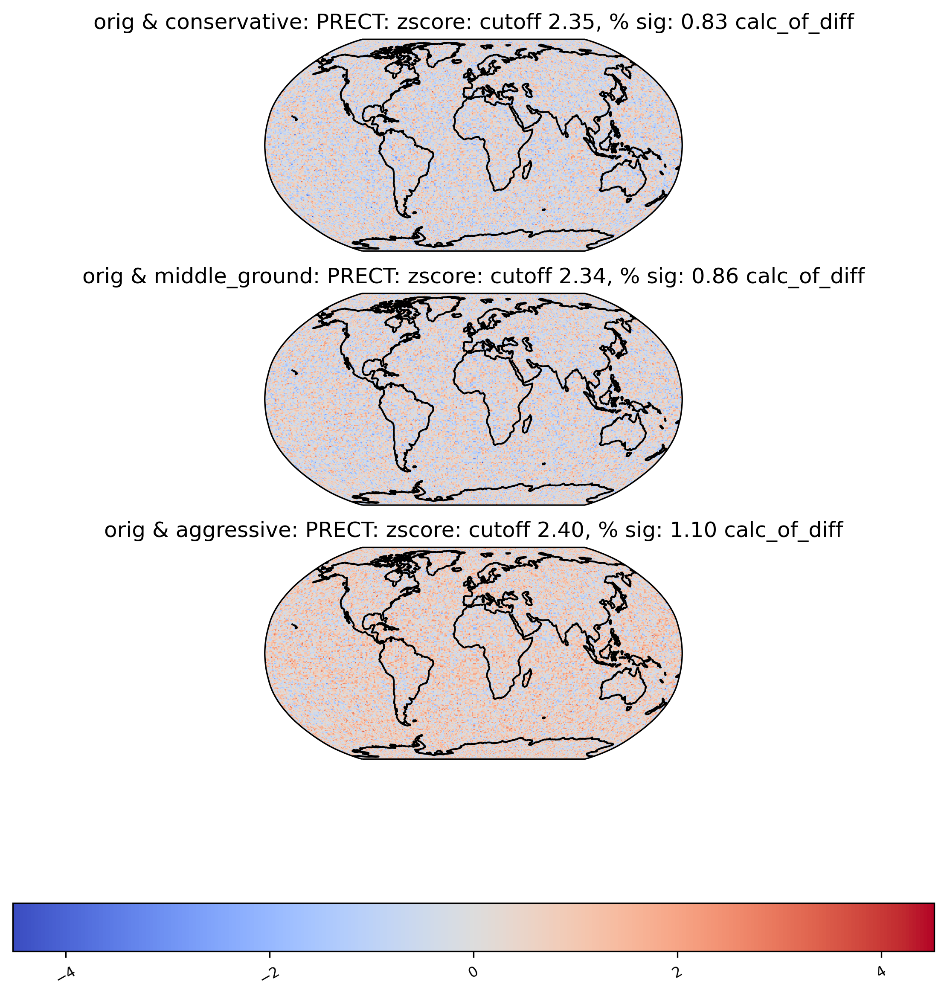

In [27]:
ldcpy.plot(
    cols[variable],
    variable,
    sets=["orig", "conservative", "middle_ground", "aggressive"],
    calc="zscore",
    calc_type="calc_of_diff",
    axes_symmetric=True,
)

### Log transformation of quantity

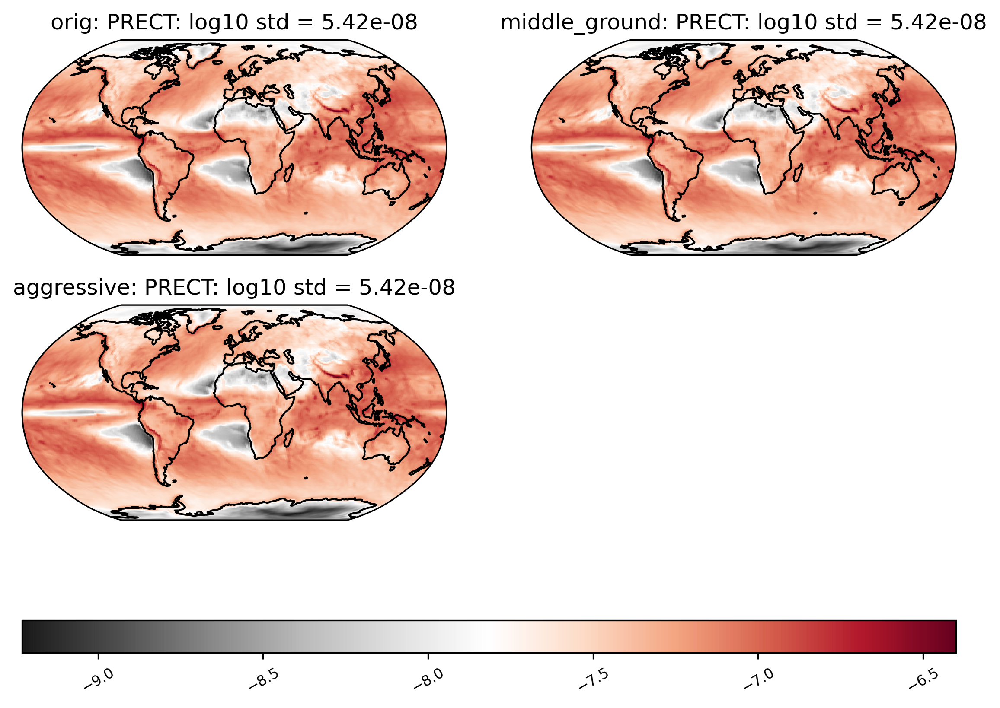

In [28]:
ldcpy.plot(
    cols[variable],
    variable,
    sets=["orig", "middle_ground", "aggressive"],
    color="RdGy_r",
    calc_type="raw",
    transform="log",
    calc=quantity,
)

### Computing a quantity on the errors

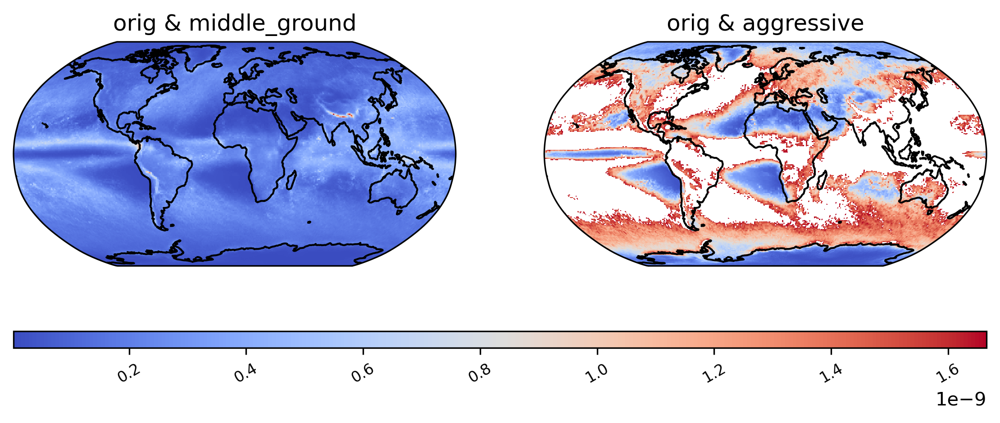

In [29]:
ldcpy.plot(
    cols[variable],
    variable,
    sets=["orig", "middle_ground", "aggressive"],
    calc_type="calc_of_diff",
    calc=quantity,
    short_title=True,
)

### Get the spatial data for a derived quantity of a variable

There are several ways to get data for a derived quantity of a variable, depending on the type of calculation and the format. All of them require obtaining the original and compressed data, and computing a quantity on the errors requires computing the difference between these two datasets. This is done below.

In [30]:
# get the orig dataset
orig_data = cols_daily[variable][variable].sel(collection="orig")

# get the middle dataset
br_mg_data = cols_daily[variable][variable].sel(collection="middle_ground")

# get the conservative dataset
br_c_data = cols_daily[variable][variable].sel(collection="conservative")

diff_data_mg = orig_data - br_mg_data
diff_data_c = orig_data - br_c_data

To compute data on a single dataset, follow the steps below. These steps require as input the dataset you are interested in (here we use the original dataset), and dask will execute the command and return the data when the load() method is used on the resulting dataArray object. To compute the error between two quantities, simply perform these steps for the original and compressed datasets, subtract the resulting dataArrays, and then load the data.

In [31]:
ds_calcs_across_time = ldcpy.Datasetcalcs(orig_data, "cam-fv", ["time"])
ds_calcs_across_time = ldcpy.Datasetcalcs(orig_data, "cam-fv", ["time"])
my_data_mean_across_time = ds_calcs_across_time.get_calc(quantity)
my_data_mean_across_time.load()

<xarray.DataArray 'PRECT' (lat: 192, lon: 288)>
array([[3.36995537e-09, 3.37003959e-09, 3.37003921e-09, ...,
        3.37004341e-09, 3.36998044e-09, 3.37005610e-09],
       [3.63565781e-09, 3.66928830e-09, 3.71118289e-09, ...,
        3.50560134e-09, 3.54283470e-09, 3.58651525e-09],
       [3.48598430e-09, 3.52017368e-09, 3.54941750e-09, ...,
        3.39627749e-09, 3.41626018e-09, 3.43969395e-09],
       ...,
       [1.41935764e-08, 1.42818440e-08, 1.44642659e-08, ...,
        1.40374630e-08, 1.40690370e-08, 1.41146443e-08],
       [1.54776586e-08, 1.54722368e-08, 1.54917874e-08, ...,
        1.53190838e-08, 1.53514734e-08, 1.54304097e-08],
       [1.16493291e-08, 1.16493572e-08, 1.16493625e-08, ...,
        1.16500554e-08, 1.16500149e-08, 1.16499884e-08]])
Coordinates:
  * lat         (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon         (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
    cell_area   (lat, lon) float64 3.382e-05 3.382e-05 ... 3.382e-05 3.382e-05
    collection  <U13 'orig'
Attributes:
    units:          
    long_name:      Total (convective and large-scale) precipitation rate (li...
    cell_methods:   time: mean
    data_type:      cam-fv
    set_name:       aggressive
    cell_measures:  area: cell_area

### Examples

Here are examples of a few interesting quantities that you can plot using the ldcpy package:

#### log(East-West Contrast Variance) for daily TS

The contrast variance measures how much quickly the data values are changing in a direction. Here we look at the east-west contrast variance for the original and several compressed datasets.

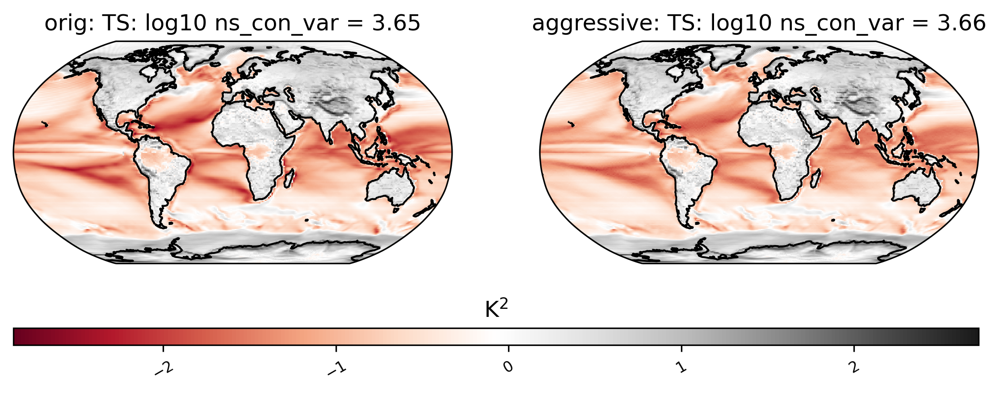

In [32]:
ldcpy.plot(
    cols_daily["TS"],
    "TS",
    sets=["orig", "aggressive"],
    color="RdGy",
    calc_type="raw",
    transform="log",
    calc="ns_con_var",
)

#### Annual Harmonic Relative Ratio

This plots shows the annual harmonic relative to the average periodogram value in a neighborhood of 50 frequencies around the annual frequency

- NOTE: This assumes the values along the "time" dimension are equally spaced.
        
- NOTE: This calc returns a lat-lon array regardless of aggregate dimensions, so can only be used in a spatial plot.

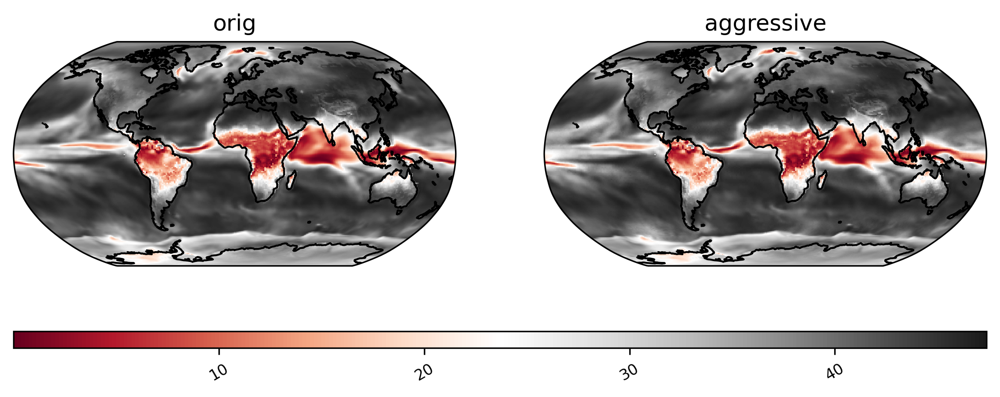

In [33]:
ldcpy.plot(
    cols_daily["TS"],
    "TS",
    sets=["orig", "aggressive"],
    color="RdGy",
    short_title=True,
    calc="ann_harmonic_ratio",
)

## CAM Budgets

We can compute some of the standard budgets for CAM (and can easily add more by request). Currently, we calculate the following CAM budgets (required variables listed in parenthesis):

    (1) restom: top of the model radiation budget (FSNT, FLNT)
    (2) precip: global precipitation (PRECC, PRECL)
    (3) e-p: evaporation-precipitation (QFLX, PRECC, PRECL)
    (4) ressurf: surface energy balance (FSNS, FLNS, SHFLX, LHFLX)


First, we need to combine the variable collections that we need for the budgets into a single dataset as below.

In [34]:
budget_ds = ldcpy.combine_datasets(
    [
        cols_monthly["FSNS"],
        cols_monthly["FSNT"],
        cols_monthly["SHFLX"],
        cols_monthly["LHFLX"],
        cols_monthly["FLNT"],
        cols_monthly["QFLX"],
        cols_monthly["PRECC"],
        cols_monthly["PRECL"],
        cols_monthly["FLNS"],
    ]
)

Now we can calculate the budgets for the sets that we want as below.  

In [35]:
ldcpy.cam_budgets(
    budget_ds,
    ["orig", "conservative", "middle_ground", "aggressive"],
    significant_digits=6,
)

,orig,conservative,middle_ground,aggressive
restom,0.574528,0.574531,0.574532,0.565134
precip,3.50037e-08,3.50037e-08,3.50033e-08,3.49865e-08
e-p,6.0489,6.0489,6.04885,6.04688
ressurf,1.42711,1.42712,1.42718,1.41598


In [36]:
client.shutdown()

2024-02-11 14:20:46,448 - distributed.client - ERROR - Failed to reconnect to scheduler after 30.00 seconds, closing client
